In [7]:
# Source - https://stackoverflow.com/a
# Posted by James Errico, modified by community. See post 'Timeline' for change history
# Retrieved 2025-12-26, License - CC BY-SA 4.0

!pip install lxml
!pip install beautifulsoup4
!pip install tqdm
!pip install matplotlib
!pip install opencv-python
# !pip install et


In [8]:
!venv/Scripts\activate

'venv' is not recognized as an internal or external command,
operable program or batch file.


In [9]:
# Immport
from xml.dom import minidom
# import ET

import bs4 as bs
import os
from pathlib import Path
import glob
from tqdm import tqdm
import random
# import cv2
import shutil
from bs4 import BeautifulSoup
import matplotlib.pyplot as plt


In [10]:
def convertPascal2YOLOv8(filePath):

    class_mapping = {
        "D00": 0,
        "D10": 1,
        "D20": 2,
        "D40": 3,
        "D01": 4,
        "D11": 5,
        "D43": 6,
        "D44": 7,
        "D50": 8
    }
    
    # reading content
    file = open(filePath, "r")
    contents = file.read()

    # parsing
    soup = bs.BeautifulSoup(contents, 'html.parser')
    image_size = soup.find_all("size")[0]
    image_width = int(image_size.find_all("width")[0].get_text())
    image_height = int(image_size.find_all("height")[0].get_text())
    # print("w,h :", image_width, image_height)

    # Process Bounding Box
    objects = soup.find_all("object")

    # Placeholder
    bounding_box_list = []
    class_list = []

    for object in objects:
        
        # Object Class
        _class = object.find_all("name")[0].get_text()
        
        # Map the class to int number, if not defined > 10
        _class = class_mapping.get(_class, 10)
        class_list.append(_class)
        
        # Object Bounding Box
        _xmin = float(object.find_all("xmin")[0].get_text())
        _ymin = float(object.find_all("ymin")[0].get_text())
        _xmax = float(object.find_all("xmax")[0].get_text())
        _ymax = float(object.find_all("ymax")[0].get_text())

        # Convert to YOLOv8 Annotation
        # class x_center y_center width height
        w = (_xmax - _xmin)
        h = (_ymax - _ymin)
        cx = _xmin + (w/2)
        cy = _ymin + (h/2)

        # Normalize
        w = round((w / image_width), 4)
        h = round((h / image_height), 4)
        cx = round((cx / image_width), 4)
        cy = round((cy / image_height), 4)

        _bbox = [cx, cy, w, h]

        # print(_class, cx, cy, w, h)

        bounding_box_list.append(_bbox)

    # Get the filename
    outputFilename = os.path.split(filePath)[1]
    outputFilename = outputFilename.replace(".xml", ".txt")

    # Output Path
    outputDir = Path(filePath).parents[2]
    outputDir = outputDir / "labels"

    # Check if the directory exists
    if not os.path.exists(outputDir):
        os.makedirs(outputDir)

    # Final output path
    outputPath = outputDir / outputFilename
    # print(outputPath)

    # Write to .txt file
    with open(outputPath, 'w') as f:
        for i in range(len(class_list)):

            # Filter the class, drop unused class
            # 0: D00 > Longitudinal Crack
            # 1: D10 > Transverse Crack
            # 2: D20 > Alligator Crack
            # 3: D40 > Potholes
            
            if class_list[i] < 4:
                anno = str(class_list[i]) + " " +  str(bounding_box_list[i][0]) + " " +  str(bounding_box_list[i][1]) + " " +  str(bounding_box_list[i][2]) + " " +  str(bounding_box_list[i][3]) + "\n"
                f.write(anno)

In [11]:
# Dataset Root Directory
ROOTDIR = "/home/oracl4/project/rdd/dataset/RDD2022/"

# Base Directory
CountryListDir = ["C:\Projects Datasets\RoadDamageDetection\\train\Czech\\annotations\\xmls",
                  "C:\Projects Datasets\RoadDamageDetection\\train\India\\annotations\\xmls",
               
]

for CountryDir in CountryListDir:
    
    CountryDir =  CountryDir
    fileList = sorted(glob.glob(CountryDir + "/*.xml"))

    # Processing all the annotation
    for file in tqdm(fileList):
        convertPascal2YOLOv8(file)
        # break

<>:5: SyntaxWarning: invalid escape sequence '\P'
<>:6: SyntaxWarning: invalid escape sequence '\P'
<>:5: SyntaxWarning: invalid escape sequence '\P'
<>:6: SyntaxWarning: invalid escape sequence '\P'
C:\Users\chanu\AppData\Local\Temp\ipykernel_12428\3597575827.py:5: SyntaxWarning: invalid escape sequence '\P'
  CountryListDir = ["C:\Projects Datasets\RoadDamageDetection\\train\Czech\\annotations\\xmls",
C:\Users\chanu\AppData\Local\Temp\ipykernel_12428\3597575827.py:6: SyntaxWarning: invalid escape sequence '\P'
  "C:\Projects Datasets\RoadDamageDetection\\train\India\\annotations\\xmls",
100%|██████████| 7706/7706 [01:38<00:00, 78.06it/s]


In [20]:
def CopyDatasetSplit(baseDir):
    
    # Split the training data to train and validation data due to lack of annotation on test data
    # Seed
    random.seed(1337)
    
    # Output Directory
    # !!! Change this to your clone folder
    baseOutputDir ="C:/Projects Datasets/RoadDamageDetection/processedData/"
    countryName = Path(baseDir).parents[0]
    countryName = os.path.split(countryName)[1]

    baseImageDir = baseDir + "images/"
    baseAnnotDir = baseDir + "annotations/xmls/"

    image_list_all = sorted(glob.glob(baseImageDir + "/*"))
    annot_list_all = sorted(glob.glob(baseAnnotDir + "/*"))

    # Drop any images that doesnt have annotation (background)
    # Or just leave it at some percentage of the dataset
    backgroundImages_Percentage = 0.1
    image_list = []
    annot_list = []
    
    dataset_length_all = len(image_list_all)
    max_background_image = int(dataset_length_all*backgroundImages_Percentage)
    _counter = 0

    for i in range(len(annot_list_all)):
        
        with open(annot_list_all[i]) as f:
            _annot = f.read()

            # Annotation not empty
            if _annot:
                image_list.append(image_list_all[i])
                annot_list.append(annot_list_all[i])
            elif _counter < max_background_image:
                image_list.append(image_list_all[i])
                annot_list.append(annot_list_all[i])
                _counter = _counter + 1
                
    # Dataset length
    dataset_length = len(image_list)
    # print(dataset_length, len(annot_list))

    split_ratio = 0.9
    middle_point = round(split_ratio * dataset_length)

    # Create random list number using seed
    numberList = list(range(0, dataset_length))
    random.shuffle(numberList)
    trainNumberList = numberList[:middle_point]
    validNumberList = numberList[middle_point:]
    print("Training/Validation Samples :", len(trainNumberList), len(validNumberList))

    # Training images and labels
    print("Copying training images and labels for", countryName)
    for i in tqdm(trainNumberList):

        # Images
        outputImagesDir = baseOutputDir + countryName + "/images/train/"
        if not os.path.exists(outputImagesDir):
            os.makedirs(outputImagesDir)

        shutil.copy2(image_list[i], outputImagesDir)

        # Annotations
        outputAnnotDir = baseOutputDir + countryName + "/labels/train/"
        if not os.path.exists(outputAnnotDir):
            os.makedirs(outputAnnotDir)

        shutil.copy2(annot_list[i], outputAnnotDir)
        # print(outputImagesDir, outputAnnotDir)

    # Validation images and labels
    print("Copying validation images and labels for", countryName)
    for i in tqdm(validNumberList):

        # Images
        outputImagesDir = baseOutputDir + countryName + "/images/val/"
        if not os.path.exists(outputImagesDir):
            os.makedirs(outputImagesDir)

        shutil.copy2(image_list[i], outputImagesDir)

        # Annotations
        outputAnnotDir = baseOutputDir + countryName + "/labels/val/"
        if not os.path.exists(outputAnnotDir):
            os.makedirs(outputAnnotDir)

        shutil.copy2(annot_list[i], outputAnnotDir)
        # print(outputImagesDir, outputAnnotDir)

# baseDir = "../dataset/RDD2022/RDD2022_all_countries/Japan/train/"
# CopyDatasetSplit(baseDir)


In [21]:
# Base Directory


# Use only japan india
CountryListDir = ["C:/Projects Datasets/RoadDamageDetection/train/Czech/",
                  "C:/Projects Datasets/RoadDamageDetection/train/India/",
                
                #   "RDD2022_all_countries/China_Drone/train/",
                #   "RDD2022_all_countries/China_MotorBike/train/",
                #   "RDD2022/RDD2022_all_countries/Czech/train/",
                #   "RDD2022/RDD2022_all_countries/Norway/Norway/train/",
                #   "RDD2022/RDD2022_all_countries/United_States/United_States/train/",
]

for CountryDir in CountryListDir:
    CountryDir =CountryDir
    CopyDatasetSplit(CountryDir)

Training/Validation Samples : 2546 283
Copying training images and labels for train


100%|██████████| 2546/2546 [00:04<00:00, 581.07it/s]


Copying validation images and labels for train


100%|██████████| 283/283 [00:00<00:00, 493.96it/s]


Training/Validation Samples : 6935 771
Copying training images and labels for train


100%|██████████| 6935/6935 [00:11<00:00, 607.60it/s]


Copying validation images and labels for train


100%|██████████| 771/771 [00:01<00:00, 654.11it/s]


In [14]:
!tree ./ -d

Too many parameters - -d


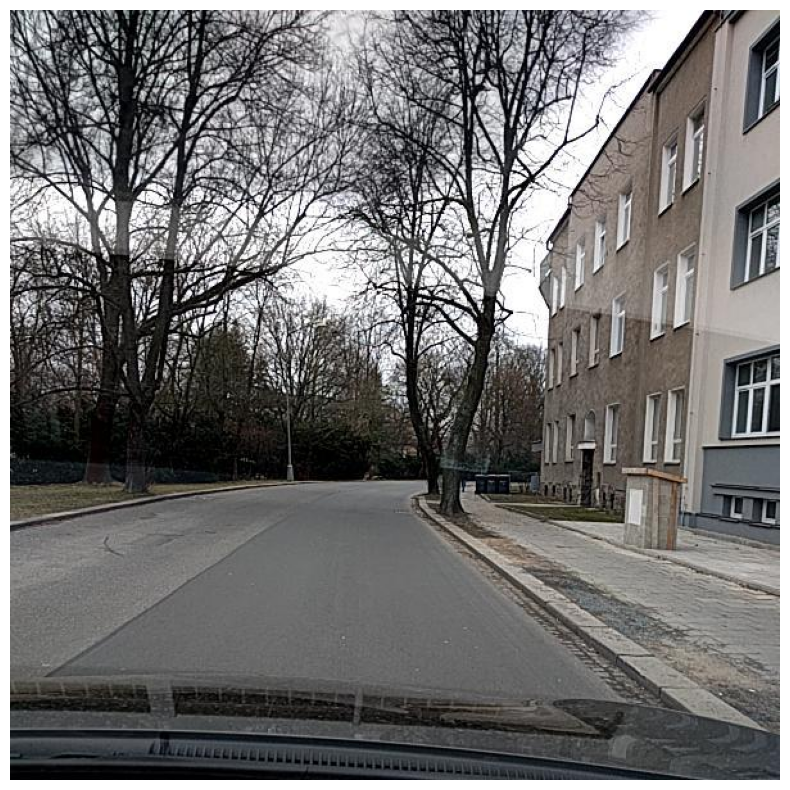

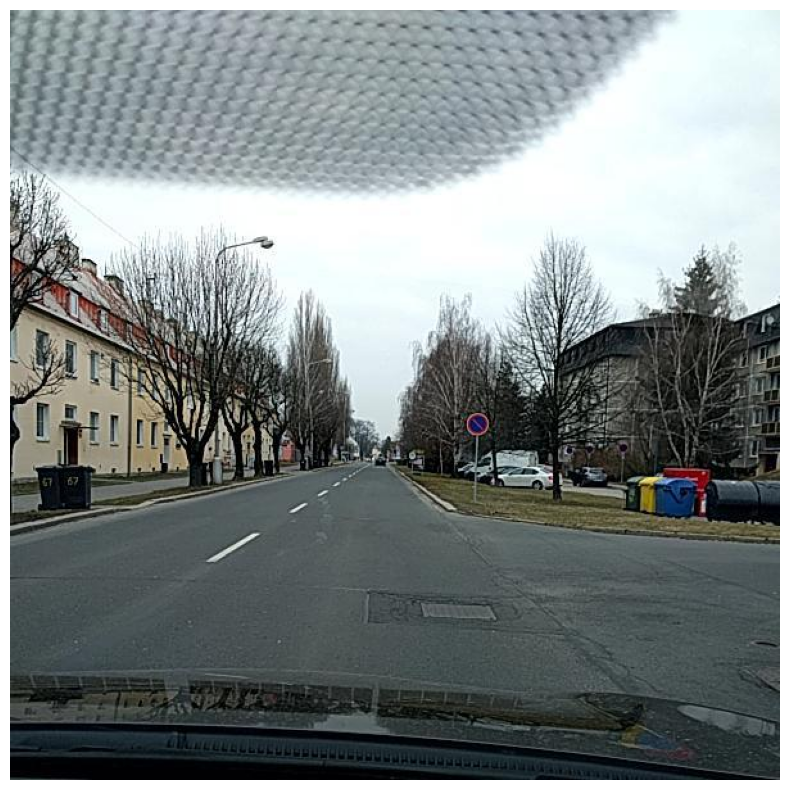

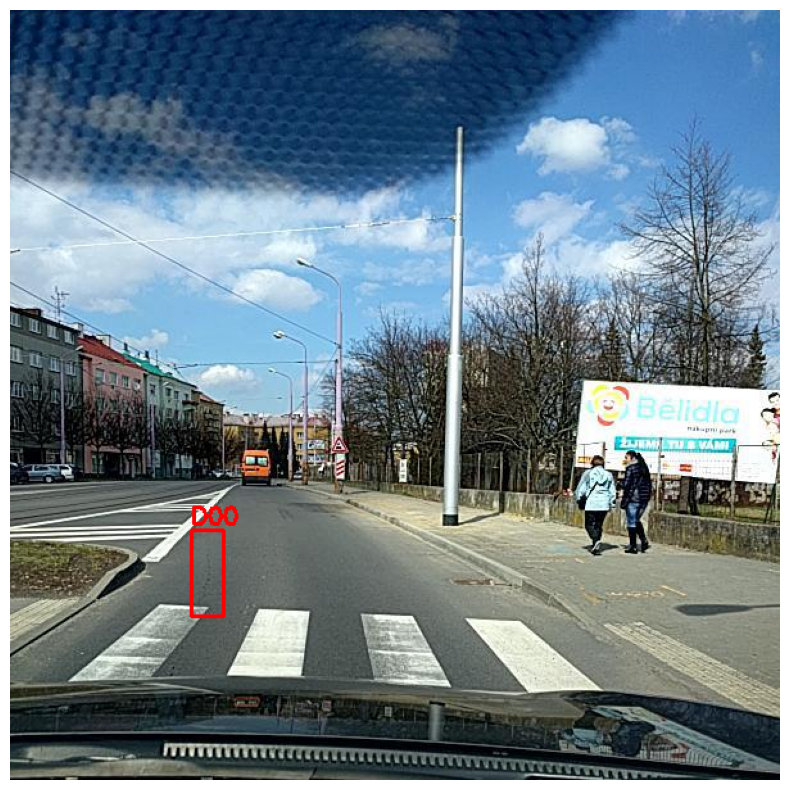

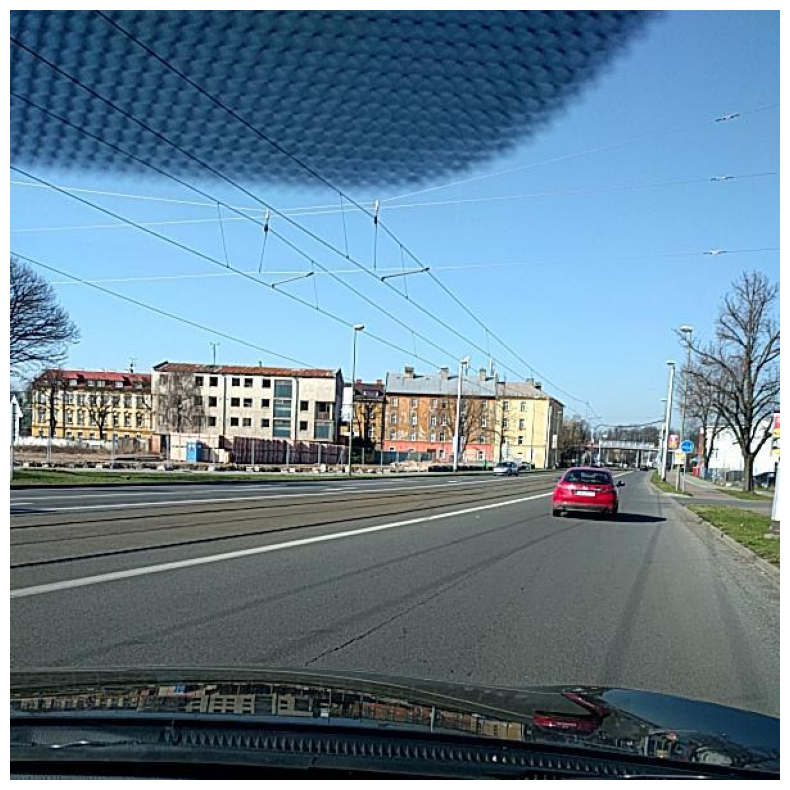

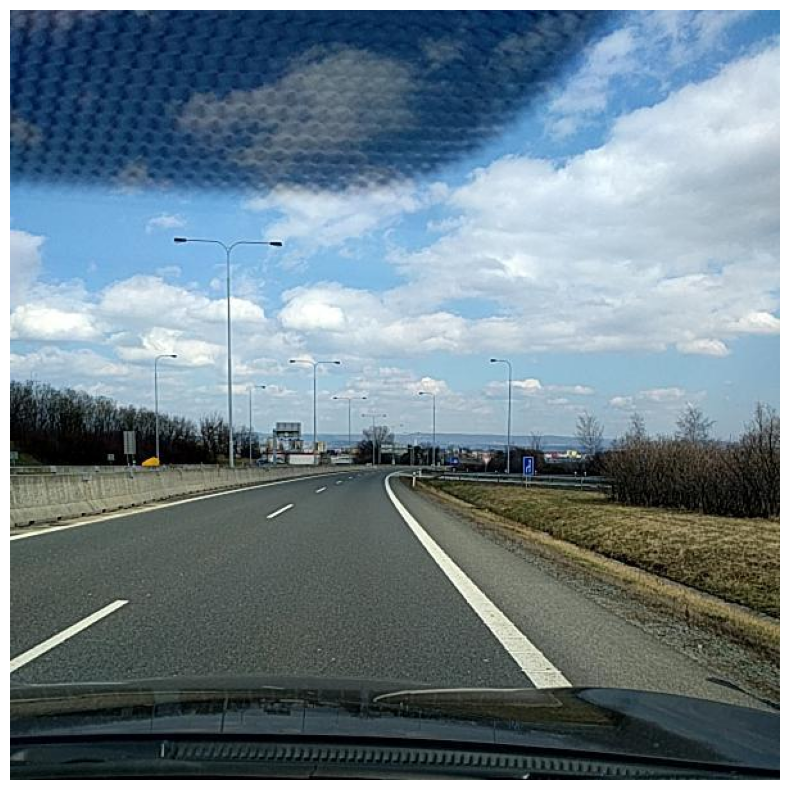

...

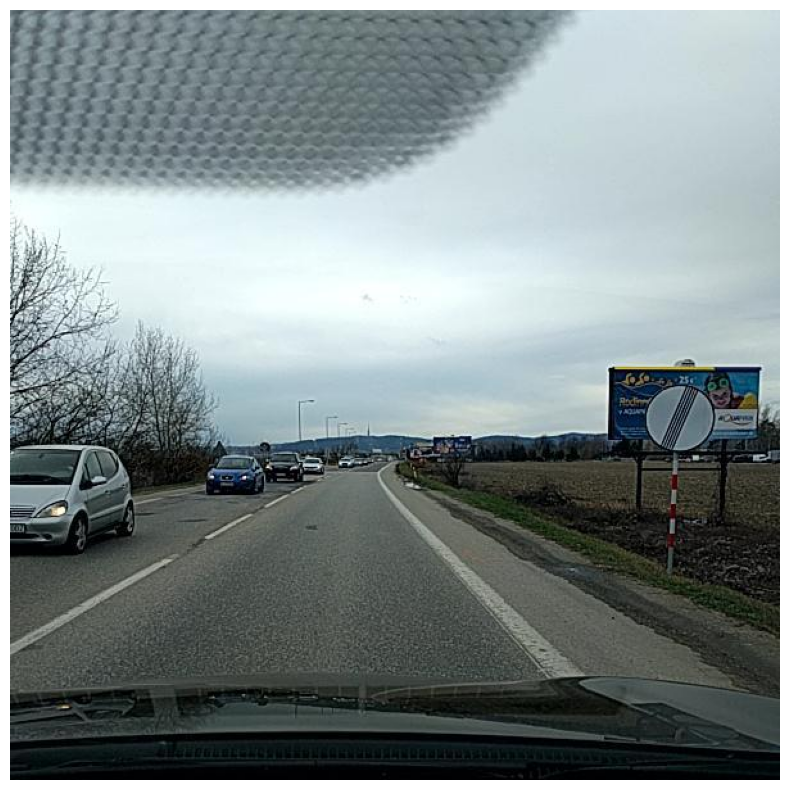

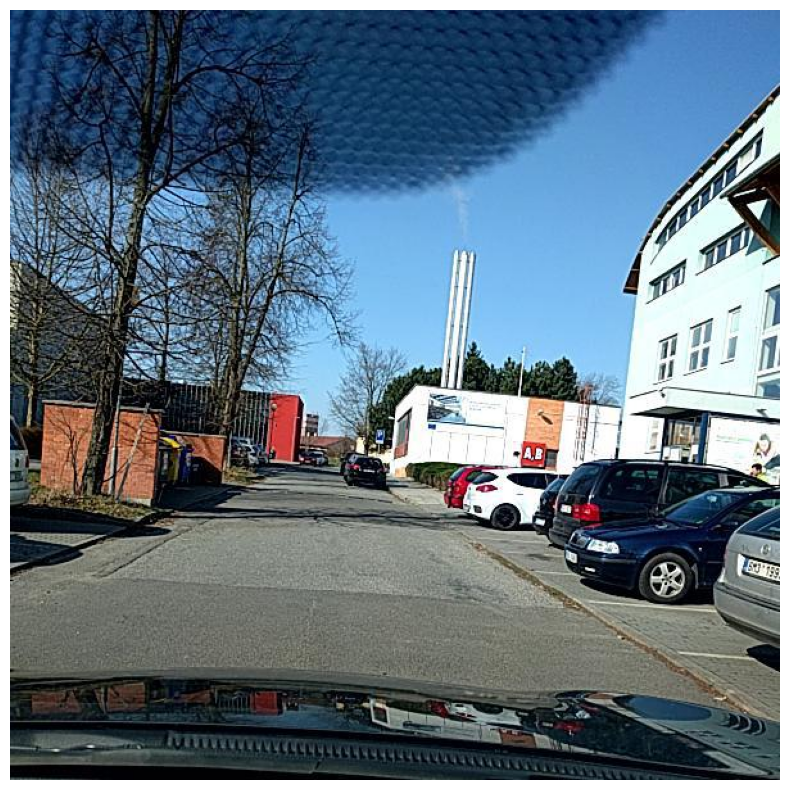

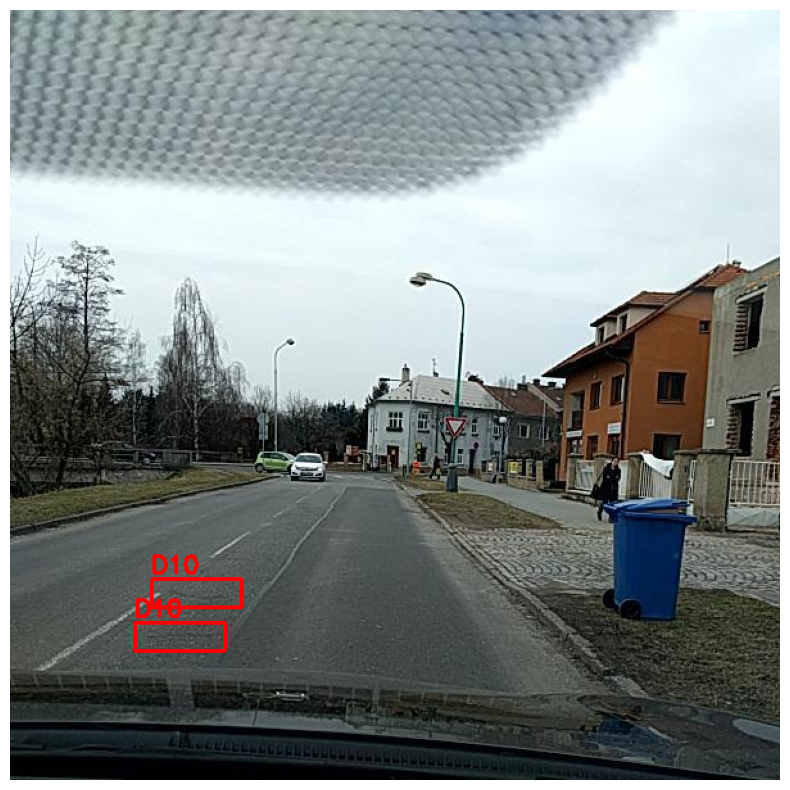

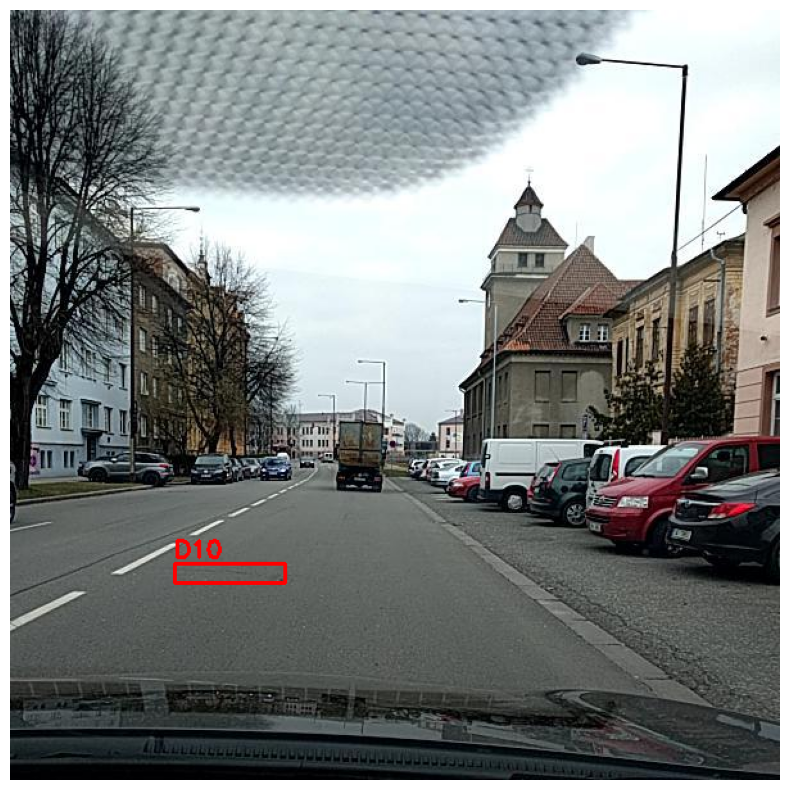

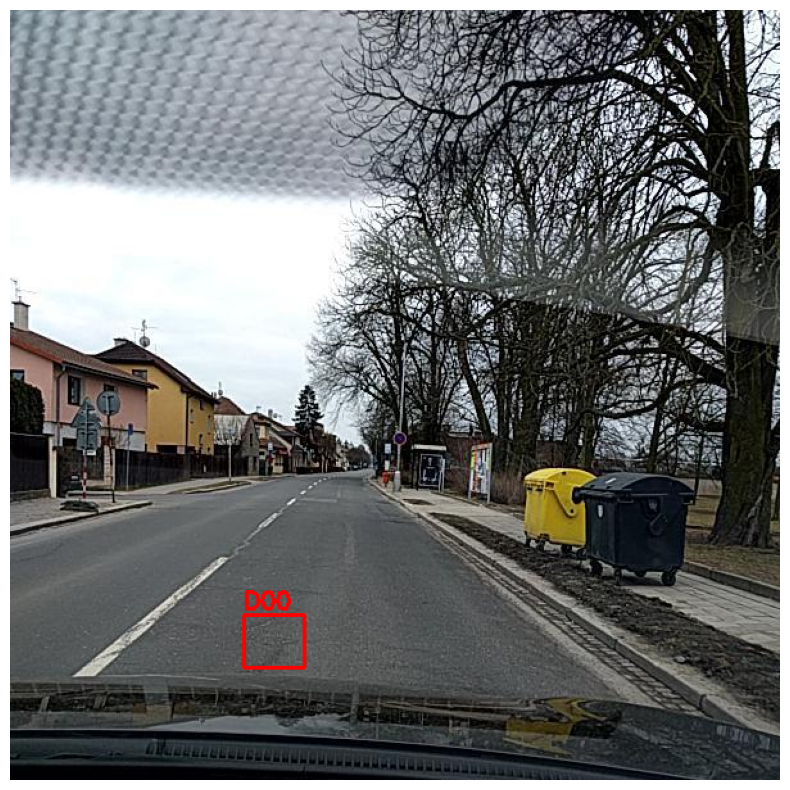

In [22]:
import cv2
import xml.etree.ElementTree as ET

base_path = "C:/Projects Datasets/RoadDamageDetection/processedData/"
 
img_dir = os.path.join(base_path, "train/images/train")
anno_dir = os.path.join(base_path, "train/labels/train")

def draw_annotations(image_path, annotation_path):
    # Load image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Parse XML
    tree = ET.parse(annotation_path)
    root = tree.getroot()

    # Loop through all objects in the annotation
    for obj in root.findall("object"):
        label = obj.find("name").text
        bbox = obj.find("bndbox")
        xmin = int(bbox.find("xmin").text)
        ymin = int(bbox.find("ymin").text)
        xmax = int(bbox.find("xmax").text)
        ymax = int(bbox.find("ymax").text)

        # Draw bounding box
        cv2.rectangle(img, (xmin, ymin), (xmax, ymax), (255,0,0), 2)
        cv2.putText(img, label, (xmin, ymin-5), cv2.FONT_HERSHEY_SIMPLEX,
                    0.6, (255,0,0), 2)

    return img

# Show a few samples
sample_images = os.listdir(img_dir)[:15]  # first 5 images
for i,img_file in enumerate(sample_images):
    image_path = os.path.join(img_dir, img_file)
    anno_path = os.path.join(anno_dir, os.path.splitext(img_file)[0] + ".xml")

    if os.path.exists(anno_path):
        annotated_img = draw_annotations(image_path, anno_path)
        plt.figure(figsize=(10,10))
        plt.imshow(annotated_img)
        plt.axis("off")
        plt.show()
#
 

In [23]:
sample_images


['Czech_000001.jpg',
 'Czech_000002.jpg',
 'Czech_000006.jpg',
 'Czech_000007.jpg',
 'Czech_000009.jpg',
 'Czech_000010.jpg',
 'Czech_000011.jpg',
 'Czech_000012.jpg',
 'Czech_000013.jpg',
 'Czech_000014.jpg',
 'Czech_000017.jpg',
 'Czech_000018.jpg',
 'Czech_000020.jpg',
 'Czech_000021.jpg',
 'Czech_000022.jpg']

In [24]:


for img in sample_images:
    img_path=os.path.join("C:/Projects Datasets/Road-Pathole-Detection/processedData/train/images/train/",img)
    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img_rgb)
    plt.axis('off')
    plt.show()

error: OpenCV(4.12.0) D:\a\opencv-python\opencv-python\opencv\modules\imgproc\src\color.cpp:199: error: (-215:Assertion failed) !_src.empty() in function 'cv::cvtColor'


In [25]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
for img in sample_images:
    img = mpimg.imread(img)
    plt.figure(figsize=(10,10))
    plt.imshow(img)
    plt.show()

print("chamira")

FileNotFoundError: [Errno 2] No such file or directory: 'Czech_000001.jpg'